In [ ]:
# Install necessary libraries
!pip install torch
!pip install transformers
!pip install tensorflow

In [ ]:
pip install pydub

In [ ]:
pip install ffmpeg-python


In [ ]:
pip install pandas numpy scikit-learn nltk

In [ ]:
pip install librosa

In [ ]:
pip install resampy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 25.9 MB/s eta 0:00:00


In [ ]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
import pandas as pd
from pydub import AudioSegment
import os

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from transformers import RobertaTokenizer, TFRobertaModel
import torch
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Bidirectional, LSTM, Dense, Flatten, Dropout
from tensorflow.keras.preprocessing.sequence import pad_sequences
from keras.callbacks import EarlyStopping

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, confusion_matrix
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
import pandas as pd
import os

Mounted at /content/drive


# Fetching Data

audio_df : Contains all the Audio file paths

transcripts_df : Contains all the Transcripts paths

emotion_df : Contain all the Emotion labels



In [ ]:
# Define the path to the top-level directory containing the sessions
top_level_path = "/content/drive/My Drive/CS 297/IEMOCAP"

# Initialize empty dataframes to store the data
audio_df = pd.DataFrame(columns=["Session", "Conversation", "Audio_Path"])
transcripts_df = pd.DataFrame(columns=["Session", "Conversation", "Transcript"])
emotion_df = pd.DataFrame(columns=["Session", "Conversation", "EmotionEvaluator", "Emotion"])

In [ ]:
for session_folder in os.listdir(top_level_path):
    session_path = os.path.join(top_level_path, session_folder)
    # Check if it's a directory
    if os.path.isdir(session_path):
        # Path to the dialog folder within the session
        dialog_path = os.path.join(session_path, "dialog")
        # Check if the dialog folder exists
        if os.path.exists(dialog_path):
            wav_path = os.path.join(dialog_path, "wav")
            for audio_file in os.listdir(wav_path):
                if audio_file.endswith(".wav"):
                    conversation_name = os.path.splitext(audio_file)[0]
                    audio_file_path = os.path.join(wav_path, audio_file)
                    audio_df = audio_df.append({
                        "Session": session_folder,
                        "Conversation": conversation_name,
                        "Audio_Path": audio_file_path
                    }, ignore_index=True)

<ipython-input-5-50a940d8181f>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  audio_df = audio_df.append({
<ipython-input-5-50a940d8181f>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  audio_df = audio_df.append({
<ipython-input-5-50a940d8181f>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  audio_df = audio_df.append({
<ipython-input-5-50a940d8181f>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  audio_df = audio_df.append({
<ipython-input-5-50a940d8181f>:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  audio_df = audio_df.append({
<ipyt

In [ ]:
for session_folder in os.listdir(top_level_path):
    session_path = os.path.join(top_level_path, session_folder)

    # Check if it's a directory
    if os.path.isdir(session_path):
        # Path to the dialog folder within the session
        dialog_path = os.path.join(session_path, "dialog")
        transcriptions_path = os.path.join(dialog_path, "transcriptions")

      # Check if the transcriptions folder exists
        if os.path.exists(transcriptions_path):
           for text_file in os.listdir(transcriptions_path):
                if text_file.endswith(".txt"):
                    conversation_name = os.path.splitext(text_file)[0]
                    transcript_file_path = os.path.join(transcriptions_path, f"{conversation_name}.txt")

                    # Read the transcript file and append to the transcripts dataframe
                    with open(transcript_file_path, "r") as transcript_file:
                        transcript_content = transcript_file.read().strip()
                        transcripts_df = transcripts_df.append({
                            "Session": session_folder,
                            "Conversation": conversation_name,
                            "Transcript": transcript_content,
                        }, ignore_index=True)

<ipython-input-6-20de75e3e29a>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  transcripts_df = transcripts_df.append({
<ipython-input-6-20de75e3e29a>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  transcripts_df = transcripts_df.append({
<ipython-input-6-20de75e3e29a>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  transcripts_df = transcripts_df.append({
<ipython-input-6-20de75e3e29a>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  transcripts_df = transcripts_df.append({
<ipython-input-6-20de75e3e29a>:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.conc

In [ ]:
# Iterate through each session
for session_folder in os.listdir(top_level_path):
    session_path = os.path.join(top_level_path, session_folder)
    if os.path.isdir(session_path):
        # Path to the dialog folder within the session
        dialog_path = os.path.join(session_path, "dialog")
        if os.path.exists(dialog_path):
            # Path to the EmoEvaluation folder
            emo_evaluation_path = os.path.join(dialog_path, "EmoEvaluation", "Categorical")

            if os.path.exists(emo_evaluation_path):
                for emotion_file in os.listdir(emo_evaluation_path):
                    if emotion_file.endswith("_cat.txt"):
                        emotion_evaluator = emotion_file.split("_")[-2].replace(".txt", "")
                        emotion_file_path = os.path.join(emo_evaluation_path, emotion_file)
                        with open(emotion_file_path, "r") as emotion_category_file:
                            emotion_content = emotion_category_file.read().strip()
                            conversation_name = emotion_file.replace(f"_{emotion_evaluator}_cat.txt", "")
                            emotion_df = emotion_df.append({
                                "Session": session_folder,
                                "Conversation": conversation_name,
                                "EmotionEvaluator": emotion_evaluator,
                                "Emotion": emotion_content
                            }, ignore_index=True)

<ipython-input-7-f657e8639368>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  emotion_df = emotion_df.append({
<ipython-input-7-f657e8639368>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  emotion_df = emotion_df.append({
<ipython-input-7-f657e8639368>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  emotion_df = emotion_df.append({
<ipython-input-7-f657e8639368>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  emotion_df = emotion_df.append({
<ipython-input-7-f657e8639368>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  emotion_df = emoti

In [ ]:
# Count the occurrences of each unique value in the "EmotionEvaluator" column
emotion_evaluator_counts = emotion_df["Session"].value_counts()
audio_counts = audio_df["Session"].value_counts()
transcripts_counts = transcripts_df["Session"].value_counts()
print(emotion_evaluator_counts,"\n",audio_counts,"\n",transcripts_counts)

Session3    96
Session5    93
Session4    90
Session2    90
Session1    84
Name: Session, dtype: int64 
 Session3    32
Session5    31
Session4    30
Session2    30
Session1    28
Name: Session, dtype: int64 
 Session3    32
Session5    31
Session4    30
Session2    30
Session1    28
Name: Session, dtype: int64


In [ ]:
from IPython.display import Audio
Audio(audio_df['Audio_Path'][0])

In [ ]:
audio_df['Audio_Path'][0]

'/content/drive/My Drive/CS 297/IEMOCAP/Session4/dialog/wav/Ses04F_script03_1.wav'

In [ ]:
# Group by "Session" and "EmotionEvaluator" and count occurrences
session_emotion_counts = emotion_df.groupby(['Session', 'EmotionEvaluator']).size().reset_index(name='Count')
sorted_session_emotion_counts = session_emotion_counts.sort_values(by=['Session', 'Count'], ascending=[True, False])
print(sorted_session_emotion_counts)

     Session EmotionEvaluator  Count
0   Session1               e1     25
3   Session1               e4     25
1   Session1               e2     24
2   Session1               e3      5
5   Session1               e6      3
4   Session1               e5      2
6   Session2               e1     29
7   Session2               e2     28
9   Session2               e4     26
11  Session2               e6      4
10  Session2               e5      2
8   Session2               e3      1
12  Session3               e1     32
13  Session3               e2     30
14  Session3               e4     30
15  Session3               e5      2
16  Session3               e6      2
17  Session4               e1     30
18  Session4               e2     29
19  Session4               e4     24
21  Session4               e6      6
20  Session4               e5      1
22  Session5               e1     31
23  Session5               e2     29
24  Session5               e4     28
26  Session5               e6      3
2

In [ ]:
# Merge audio_df and transcripts_df on 'Session' and 'Conversation'
combined_df = pd.merge(audio_df, transcripts_df, on=['Session', 'Conversation'], how='inner')

In [ ]:
joined_emotions = []

# Iterate over the rows in merged_df
for index, row in combined_df.iterrows():
    session = row['Session']
    conversation = row['Conversation']

    # Find corresponding rows in emotion_df based on "Session" and "Conversation"
    emotion_rows = emotion_df[(emotion_df['Session'] == session) & (emotion_df['Conversation'] == conversation)]
    first_emotion_evaluator = None
    for evaluator in ['e1', 'e2', 'e3', 'e4', 'e5', 'e6']:
        evaluator_rows = emotion_rows[emotion_rows['EmotionEvaluator'] == evaluator]
        if not evaluator_rows.empty:
            first_emotion_evaluator = evaluator_rows.iloc[0]['Emotion']
            break
    joined_emotions.append(first_emotion_evaluator)


combined_df['Joined_Emotion'] = joined_emotions

In [ ]:
import pandas as pd

# Initialize the new DataFrame
columns = ['Session', 'Conversation', 'Audio_Path', 'Speaker_id','Transcript', 'Time_Frame', 'Emotion']
final_df = pd.DataFrame(columns=columns)

# Iterate through each row in the original dataframe
for _, row in combined_df.iterrows():
    # Get the list of emotions for the current row
    emotion_dict = {}
    emotion_list = row['Joined_Emotion'].split('\n')
    for emotion_line in emotion_list:
        parts = emotion_line.split(':')
        if len(parts) >= 2:
            speaker_id_emotion = parts[0]
            emotion = parts[1]
            emotion_dict[speaker_id_emotion.strip()] = emotion.strip()

    # Get the list of utterances and time frames for the current row
    transcript_list = row['Transcript'].split('\n')
    for transcript_line in transcript_list:
        parts = transcript_line.split(' ', 1)
        if len(parts) >= 2:
            speaker_id_transcript, transcript_info = parts
            # Extracting time frame or setting a default value
            time_frame_parts = transcript_info.split('[')
            if len(time_frame_parts) > 1:
                time_frame = time_frame_parts[1].split(']')[0]
            else:
                time_frame = 'N/A'

        # Create a row in the final DataFrame
        final_df = final_df.append({
            'Session': row['Session'],
            'Conversation': row['Conversation'],
            'Audio_Path': row['Audio_Path'],
            'Speaker_id' : speaker_id_transcript,
            'Transcript': transcript_info.strip(),
            'Time_Frame': time_frame,
            'Emotion': emotion_dict.get(speaker_id_transcript.strip(), '')  # Use get to handle missing keys
        }, ignore_index=True)


Streaming output truncated to the last 5000 lines.
<ipython-input-30-b74dacfa2398>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df = final_df.append({
<ipython-input-30-b74dacfa2398>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df = final_df.append({
<ipython-input-30-b74dacfa2398>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df = final_df.append({
<ipython-input-30-b74dacfa2398>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  final_df = final_df.append({
<ipython-input-30-b74dacfa2398>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pan

In [ ]:
final_df.head()

,Session,Conversation,Audio_Path,Speaker_id,Transcript,Time_Frame,Emotion
0,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M000,[006.2551-008.1400]: Good God.,006.2551-008.1400,Frustration; ()
1,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F000,[007.7500-009.1900]: Do you think it's them?,007.7500-009.1900,Frustration; ()
2,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M001,[008.6300-009.6700]: I wonder.,008.6300-009.6700,Fear; ()
3,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F001,[009.2300-011.8600]: Nobody knows we're here e...,009.2300-011.8600,Frustration; ()
4,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M002,[011.4300-012.7900]: It must be them then.,011.4300-012.7900,Fear; ()


# Audio Preprocessing

In [ ]:
# Assuming you have the final_df DataFrame from the previous code snippet

# Clean and format the 'Emotion' columns
final_df['Emotion'] = final_df['Emotion'].str.replace(r'[;()]', '', regex=True)
# Extract text after ':' in the 'Transcript' column
final_df['Transcript'] = final_df['Transcript'].str.extract(r':\s*(.*)')

In [ ]:
final_df.head()

,Session,Conversation,Audio_Path,Speaker_id,Transcript,Time_Frame,Emotion
0,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M000,Good God.,006.2551-008.1400,Frustration
1,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F000,Do you think it's them?,007.7500-009.1900,Frustration
2,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M001,I wonder.,008.6300-009.6700,Fear
3,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F001,Nobody knows we're here except Freda and she w...,009.2300-011.8600,Frustration
4,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M002,It must be them then.,011.4300-012.7900,Fear


In [ ]:
df = final_df

In [ ]:
import pandas as pd
from pydub import AudioSegment
import os

drive_path = "/content/drive/My Drive/CS 297/IEMOCAP"

error_indices = []
cropped_audio_paths = []

for index, row in df.iterrows():
    try:
        # Parse the time frame
        start_time, end_time = row['Time_Frame'].split('-')
        start_time = int(float(start_time) * 1000)
        end_time = int(float(end_time) * 1000)
        audio_path = row['Audio_Path']
        audio = AudioSegment.from_wav(audio_path)
        cropped_audio = audio[start_time:end_time]
        session_folder = os.path.join(drive_path, row['Session'])
        uttrances_folder = os.path.join(session_folder, "Audio_Uttrances")
        conversation_folder = os.path.join(uttrances_folder, row['Conversation'])
        os.makedirs(conversation_folder, exist_ok=True)
        cropped_audio_path = os.path.join(conversation_folder, row['Speaker_id'] + '.wav')
        cropped_audio.export(cropped_audio_path, format="wav")
        cropped_audio_paths.append(cropped_audio_path)

        print(f"Cropped audio saved to: {cropped_audio_path}")

    except ValueError:
        error_indices.append(index)
        print(f"Error in row {index}: Time_Frame format incorrect. Skipping this row.")

df.drop(error_indices, inplace=True)

df['Audio_Uttrance_Path'] = cropped_audio_paths
df.to_csv('updated_data.csv', index=False)


In [ ]:
filtered_audio_paths = [path for i, path in enumerate(cropped_audio_paths) if i not in error_indices]

In [ ]:
df['Audio_Uttrance_Path'] = filtered_audio_paths
df.to_csv('updated_data.csv', index=False)

In [ ]:
df.head()

,Session,Conversation,Audio_Path,Speaker_id,Transcript,Time_Frame,Emotion,Audio_Uttrance_Path
0,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M000,Good God.,006.2551-008.1400,Frustration,/content/drive/My Drive/CS 297/IEMOCAP/Session...
1,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F000,Do you think it's them?,007.7500-009.1900,Frustration,/content/drive/My Drive/CS 297/IEMOCAP/Session...
2,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M001,I wonder.,008.6300-009.6700,Fear,/content/drive/My Drive/CS 297/IEMOCAP/Session...
3,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F001,Nobody knows we're here except Freda and she w...,009.2300-011.8600,Frustration,/content/drive/My Drive/CS 297/IEMOCAP/Session...
4,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M002,It must be them then.,011.4300-012.7900,Fear,/content/drive/My Drive/CS 297/IEMOCAP/Session...


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10095 entries, 0 to 10238
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Session              10095 non-null  object
 1   Conversation         10095 non-null  object
 2   Audio_Path           10095 non-null  object
 3   Speaker_id           10095 non-null  object
 4   Transcript           10095 non-null  object
 5   Time_Frame           10095 non-null  object
 6   Emotion              10095 non-null  object
 7   Audio_Uttrance_Path  10095 non-null  object
dtypes: object(8)
memory usage: 709.8+ KB


In [ ]:
final_df['Emotion'] = final_df['Emotion'].str.replace(';', '').str.replace(r'\([^)]*\)', '').str.strip()

<ipython-input-16-967d476041f4>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  final_df['Emotion'] = final_df['Emotion'].str.replace(';', '').str.replace(r'\([^)]*\)', '').str.strip()


In [ ]:
final_df['Emotion'].nunique()

29

In [ ]:
final_df['Emotion'].value_counts()

Frustration                                             3832
Excited                                                 2507
Anger                                                   1229
Sadness                                                 1185
Neutral state                                            576
Happiness                                                496
                                                         192
Fear                                                     134
Surprise                                                  24
Other amused                                              16
Other despair                                             13
Disgust                                                    4
Other melancolia                                           4
Other annoyed                                              4
Other melancolic                                           3
Other                                                      3
Other pride             

In [ ]:
target_labels = ['Frustration', 'Excited', 'Anger', 'Sadness', 'Neutral state', 'Happiness']
final_df.loc[~final_df['Emotion'].isin(target_labels), 'Emotion'] = 'Other'
final_df = final_df[final_df['Emotion'].notna()]

In [ ]:
final_df['Emotion'].unique()

array(['Frustration', 'Other', 'Excited', 'Sadness', 'Anger',
       'Neutral state', 'Happiness'], dtype=object)

In [ ]:
final_df.head()

,Session,Conversation,Audio_Path,Transcript,Time_Frame,Emotion
0,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Good God.,006.2551-008.1400,Frustration
1,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Do you think it's them?,007.7500-009.1900,Frustration
2,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,I wonder.,008.6300-009.6700,Other
3,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Nobody knows we're here except Freda and she w...,009.2300-011.8600,Frustration
4,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,It must be them then.,011.4300-012.7900,Other


In [ ]:
final_df['Emotion'].value_counts()

Frustration      3832
Excited          2507
Anger            1229
Sadness          1185
Neutral state     576
Happiness         496
Other             414
Name: Emotion, dtype: int64

In [ ]:
final_df['Transcript'].fillna('', inplace=True)
X = final_df['Transcript']
y = final_df['Emotion']

In [ ]:
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

In [ ]:
# Load RoBERTa tokenizer and model
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')
roberta_model = TFRobertaModel.from_pretrained('roberta-base')

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFRobertaModel: ['lm_head.dense.weight', 'roberta.embeddings.position_ids', 'lm_head.layer_norm.bias', 'lm_head.layer_norm.weight', 'lm_head.bias', 'lm_head.dense.bias']
- This IS expected if you are initializing TFRobertaModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFRobertaModel were not initialized from the PyTorch model and are newly initialized: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and infe

In [ ]:
# Tokenize and encode the text using RoBERTa for both train and test
X_train_encoded = [tokenizer.encode(str(text), add_special_tokens=True, return_tensors="tf") for text in X_train]
X_test_encoded = [tokenizer.encode(str(text), add_special_tokens=True, return_tensors="tf") for text in X_test]

In [ ]:
X_test_encoded[0][0]

<tf.Tensor: shape=(1, 7), dtype=int32, numpy=array([[   0, 7424,   51, 1649,   89,  116,    2]], dtype=int32)>

In [ ]:
X_test_encoded[0][0]

<tf.Tensor: shape=(7,), dtype=int32, numpy=array([   0, 7424,   51, 1649,   89,  116,    2], dtype=int32)>

In [ ]:
max_length = max(max(seq.shape[1] for seq in X_train_encoded), max(seq.shape[1] for seq in X_test_encoded))

In [ ]:
max_length

144

In [ ]:
X_train_inner = [seq[0] for seq in X_train_encoded]
X_test_inner = [seq[0] for seq in X_test_encoded]

# Pad sequences to have consistent length
X_train_padded = pad_sequences(X_train_inner, maxlen=max_length, padding='post', truncating='post')
X_test_padded = pad_sequences(X_test_inner, maxlen=max_length, padding='post', truncating='post')

In [ ]:
# Limit sequence length
max_length = 50  # You can adjust this value
X_train_padded = pad_sequences(X_train_inner, maxlen=max_length, padding='post', truncating='post')
X_test_padded = pad_sequences(X_test_inner, maxlen=max_length, padding='post', truncating='post')

In [ ]:
X_train_padded[9]

array([   0, 2409,   47,  888,   26, 4420,    4, 1437,   38,   64,   75,
        679,   24,    4, 1437,   38,  393,  802,   47,   74,  120, 2997,
          4,    2,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0], dtype=int32)

In [ ]:
# Get RoBERTa embeddings for both train and test
X_train_embeddings = roberta_model(X_train_padded)['last_hidden_state']
X_test_embeddings = roberta_model(X_test_padded)['last_hidden_state']

In [ ]:
def create_dataset(X, batch_size):
    dataset = tf.data.Dataset.from_tensor_slices(X)
    dataset = dataset.batch(batch_size)
    return dataset

# Define batch size
batch_size = 4

# Create datasets for training and testing
train_dataset = create_dataset(X_train_padded, batch_size)
test_dataset = create_dataset(X_test_padded, batch_size)

# Initialize an empty list to store embeddings
train_embeddings = []
test_embeddings = []

# Process batches and get embeddings
for batch in train_dataset:
    embeddings = roberta_model(batch)['last_hidden_state']
    train_embeddings.append(embeddings)

for batch in test_dataset:
    embeddings = roberta_model(batch)['last_hidden_state']
    test_embeddings.append(embeddings)

# Concatenate the embeddings
X_train_embeddings = tf.concat(train_embeddings, axis=0)
X_test_embeddings = tf.concat(test_embeddings, axis=0)


In [ ]:
# Enable mixed precision
from tensorflow.keras.mixed_precision import experimental as mixed_precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_policy(policy)


In [ ]:
from keras.layers import Bidirectional, LSTM, Dense, TimeDistributed

In [ ]:
y_train = y_train.reshape(-1, 1)

In [ ]:
from keras.utils import to_categorical
y_train_one_hot = to_categorical(y_train, num_classes=7)

In [ ]:
from keras.models import Sequential
from keras.layers import Bidirectional, LSTM, Dense

# Assuming the shape of RoBERTa embeddings: (batch_size, sequence_length, hidden_size)
max_length = X_train_embeddings.shape[1]
hidden_size = X_train_embeddings.shape[2]

# Define your model
model = Sequential()
model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=(50, 768)))
model.add(TimeDistributed(Dense(7, activation='softmax')))

# Compile and fit the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.fit(X_train_embeddings, y_train_one_hot, epochs=5, batch_size=32, validation_split=0.2)

In [ ]:
X_train_embeddings.shape

TensorShape([8191, 50, 768])

In [ ]:
print(model.summary())

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_11 (Bidirect  (None, 50, 128)           426496    
 ional)                                                          
                                                                 
 time_distributed_1 (TimeDi  (None, 50, 7)             903       
 stributed)                                                      
                                                                 
Total params: 427399 (1.63 MB)
Trainable params: 427399 (1.63 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


In [ ]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train_embeddings, y_train, epochs=5, batch_size=32, validation_split=0.2)

In [ ]:
# Evaluate the model
test_loss, test_acc = model.evaluate(X_test_embeddings, y_test)
print(f"Test Accuracy: {test_acc}")

# LSTM Part - 2

In [ ]:
df = final_df

In [ ]:
import re
def preprocess_text(text):
    if isinstance(text, str):
        # Lowercasing and keeping important punctuation
        text = text.lower()
        text = re.sub(r'[^a-z\s\?\!]', '', text)
        # Other preprocessing steps if needed
    return text



df['Processed_Transcript'] = df['Transcript'].apply(preprocess_text)

In [ ]:
non_text_mask = df['Transcript'].apply(lambda x: not isinstance(x, str))
df = df[~non_text_mask]
df = df.reset_index(drop=True)

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer

In [ ]:
tokenizer = Tokenizer(num_words=5000, oov_token='<OOV>')
tokenizer.fit_on_texts(df['Processed_Transcript'])
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(df['Processed_Transcript'])
max_length = max([len(x) for x in sequences])  # You can also set a predefined max_length
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(df['Emotion'])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(padded_sequences, encoded_labels, test_size=0.2, random_state=42)

In [ ]:
def create_lstm_model():
    model = Sequential()
    model.add(Embedding(input_dim=5000, output_dim=64, input_length=max_length))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(len(label_encoder.classes_), activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [ ]:
def create_bilstm_model():
    model = Sequential()
    model.add(Embedding(input_dim=5000, output_dim=64, input_length=max_length))
    model.add(Bidirectional(LSTM(64, return_sequences=False)))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(len(label_encoder.classes_), activation='softmax'))
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [ ]:
model = create_lstm_model()

In [ ]:
model2 = create_bilstm_model()

In [ ]:
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), batch_size=32)

Epoch 1/10
253/253 [==============================] - 35s 96ms/step - loss: 1.6814 - accuracy: 0.3550 - val_loss: 1.6425 - val_accuracy: 0.3896
Epoch 2/10
253/253 [==============================] - 4s 17ms/step - loss: 1.6525 - accuracy: 0.3731 - val_loss: 1.6326 - val_accuracy: 0.3896
Epoch 3/10
253/253 [==============================] - 4s 15ms/step - loss: 1.6473 - accuracy: 0.3763 - val_loss: 1.6356 - val_accuracy: 0.3896
Epoch 4/10
253/253 [==============================] - 5s 19ms/step - loss: 1.6441 - accuracy: 0.3762 - val_loss: 1.6351 - val_accuracy: 0.3896
Epoch 5/10
253/253 [==============================] - 6s 22ms/step - loss: 1.6419 - accuracy: 0.3762 - val_loss: 1.6355 - val_accuracy: 0.3896
Epoch 6/10
253/253 [==============================] - 3s 10ms/step - loss: 1.6416 - accuracy: 0.3770 - val_loss: 1.6390 - val_accuracy: 0.3896
Epoch 7/10
253/253 [==============================] - 2s 8ms/step - loss: 1.6384 - accuracy: 0.3770 - val_loss: 1.6327 - val_accuracy: 0.3896

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_test, y_test), batch_size=32, callbacks=[early_stopping])

Epoch 1/10
253/253 [==============================] - 18s 61ms/step - loss: 1.6821 - accuracy: 0.3658 - val_loss: 1.6374 - val_accuracy: 0.3896
Epoch 2/10
253/253 [==============================] - 6s 22ms/step - loss: 1.6491 - accuracy: 0.3759 - val_loss: 1.6334 - val_accuracy: 0.3896
Epoch 3/10
253/253 [==============================] - 4s 15ms/step - loss: 1.6509 - accuracy: 0.3765 - val_loss: 1.6380 - val_accuracy: 0.3896
Epoch 4/10
253/253 [==============================] - 3s 12ms/step - loss: 1.6454 - accuracy: 0.3769 - val_loss: 1.6318 - val_accuracy: 0.3896
Epoch 5/10
253/253 [==============================] - 3s 10ms/step - loss: 1.6424 - accuracy: 0.3770 - val_loss: 1.6327 - val_accuracy: 0.3896
Epoch 6/10
253/253 [==============================] - 2s 9ms/step - loss: 1.6415 - accuracy: 0.3770 - val_loss: 1.6346 - val_accuracy: 0.3896
Epoch 7/10
253/253 [==============================] - 2s 9ms/step - loss: 1.6396 - accuracy: 0.3770 - val_loss: 1.6328 - val_accuracy: 0.3896


In [ ]:
y_pred_probs = model.predict(X_test)

# Get the predicted class for each example
y_pred = np.argmax(y_pred_probs, axis=1)

# Calculate the F1 score
f1 = f1_score(y_test, y_pred, average='weighted')
print(f"F1 Score: {f1:.4f}")

64/64 [==============================] - 1s 5ms/step
F1 Score: 0.2185


In [ ]:
import matplotlib.pyplot as plt
def plot_training_history(history):
    plt.figure(figsize=(12, 4))

    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Accuracy over epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Loss over epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

In [ ]:
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

64/64 [==============================] - 1s 7ms/step - loss: 1.6332 - accuracy: 0.3896
Test Accuracy: 38.96%


In [ ]:
history2 = model2.fit(X_train, y_train, epochs=20, validation_data=(X_test, y_test), batch_size=32)

Epoch 1/20
253/253 [==============================] - 21s 57ms/step - loss: 1.6436 - accuracy: 0.3924 - val_loss: 1.5625 - val_accuracy: 0.4401
Epoch 2/20
253/253 [==============================] - 6s 22ms/step - loss: 1.4255 - accuracy: 0.5052 - val_loss: 1.4234 - val_accuracy: 0.4901
Epoch 3/20
253/253 [==============================] - 4s 17ms/step - loss: 1.2796 - accuracy: 0.5484 - val_loss: 1.4226 - val_accuracy: 0.5005
Epoch 4/20
253/253 [==============================] - 4s 15ms/step - loss: 1.1891 - accuracy: 0.5754 - val_loss: 1.4101 - val_accuracy: 0.5124
Epoch 5/20
253/253 [==============================] - 4s 16ms/step - loss: 1.0998 - accuracy: 0.6025 - val_loss: 1.4289 - val_accuracy: 0.5163
Epoch 6/20
253/253 [==============================] - 5s 19ms/step - loss: 1.0357 - accuracy: 0.6290 - val_loss: 1.4610 - val_accuracy: 0.5010
Epoch 7/20
253/253 [==============================] - 4s 16ms/step - loss: 0.9700 - accuracy: 0.6599 - val_loss: 1.5138 - val_accuracy: 0.505

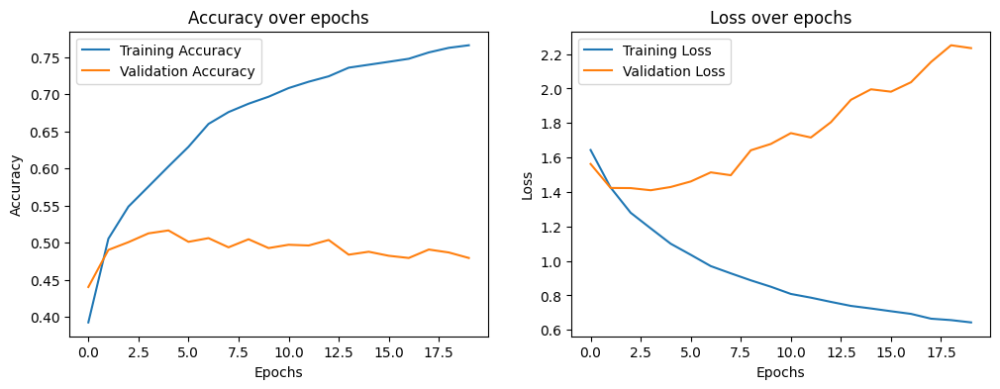

In [ ]:
plot_training_history(history2)

In [ ]:
test_loss, test_accuracy = model2.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

64/64 [==============================] - 1s 11ms/step - loss: 2.2346 - accuracy: 0.4792
Test Accuracy: 47.92%


# Audio Classification

## Audio Feature Extraction
Using Librosa,spacy

In [ ]:
df = pd.read_csv("updated_data.csv")

In [ ]:
df['Audio_Uttrance_Path'][0]

'/content/drive/My Drive/CS 297/IEMOCAP/Session4/Audio_Uttrances/Ses04F_script03_1/Ses04F_script03_1_M000.wav'

In [ ]:
import librosa
import numpy as np

def extract_features(audio_path):
    try:
        audio, sample_rate = librosa.load(audio_path, res_type='kaiser_fast')
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccs_processed = np.mean(mfccs.T, axis=0)
    except Exception as e:
        print(f"Error encountered while parsing file: {audio_path}")
        return None
    return mfccs_processed

df['MFCCs'] = df['Audio_Uttrance_Path'].apply(extract_features)

In [ ]:
pip install scipy numpy


In [ ]:
import numpy as np
from scipy.io import wavfile
from scipy.fftpack import dct

def calculate_mfccs(file_path, num_ceps=12, n_fft=512, hop_length=160, n_filters=40):
    try:
        # Read the WAV file
        sample_rate, signal = wavfile.read(file_path)

        # Pre-Emphasis
        pre_emphasis = 0.97
        emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])

        # Framing
        frame_size = 0.025
        frame_stride = 0.01
        frame_length, frame_step = frame_size * sample_rate, frame_stride * sample_rate
        signal_length = len(emphasized_signal)
        frame_length = int(round(frame_length))
        frame_step = int(round(frame_step))
        num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))

        pad_signal_length = num_frames * frame_step + frame_length
        z = np.zeros((pad_signal_length - signal_length))
        pad_signal = np.append(emphasized_signal, z)

        indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
        frames = pad_signal[indices.astype(np.int32, copy=False)]

        # Window
        frames *= np.hamming(frame_length)

        # FFT and Power Spectrum
        NFFT = n_fft
        mag_frames = np.absolute(np.fft.rfft(frames, NFFT))
        pow_frames = ((1.0 / NFFT) * ((mag_frames) ** 2))

        # Filter Banks
        low_freq_mel = 0
        high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700))
        mel_points = np.linspace(low_freq_mel, high_freq_mel, n_filters + 2)
        hz_points = (700 * (10**(mel_points / 2595) - 1))
        bin = np.floor((NFFT + 1) * hz_points / sample_rate)

        fbank = np.zeros((n_filters, int(np.floor(NFFT / 2 + 1))))
        for m in range(1, n_filters + 1):
            f_m_minus = int(bin[m - 1])
            f_m = int(bin[m])
            f_m_plus = int(bin[m + 1])

            for k in range(f_m_minus, f_m):
                fbank[m - 1, k] = (k - bin[m - 1]) / (bin[m] - bin[m - 1])
            for k in range(f_m, f_m_plus):
                fbank[m - 1, k] = (bin[m + 1] - k) / (bin[m + 1] - bin[m])

        filter_banks = np.dot(pow_frames, fbank.T)
        filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks)
        filter_banks = 20 * np.log10(filter_banks)

        # MFCCs
        num_ceps = num_ceps
        mfccs = dct(filter_banks, type=2, axis=1, norm='ortho')[:, 1 : (num_ceps + 1)]

        # Mean Normalization
        mfccs -= (np.mean(mfccs, axis=0) + 1e-8)

        return mfccs

    except Exception as e:
        print(f"Error encountered while parsing file: {file_path}, Error: {e}")
        return None

# Example usage
df['MFCCs'] = df['Audio_Uttrance_Path'].apply(calculate_mfccs)


Error encountered while parsing file: /content/drive/My Drive/CS 297/IEMOCAP/Session5/Audio_Uttrances/Ses05M_impro06/Ses05M_impro06_FXX2.wav, Error: index 0 is out of bounds for axis 0 with size 0


In [ ]:
df.to_csv('updated_data_mfcc.csv', index=False)

In [ ]:
df.head()

,Session,Conversation,Audio_Path,Speaker_id,Transcript,Time_Frame,Emotion,Audio_Uttrance_Path,MFCCs
0,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M000,Good God.,006.2551-008.1400,Frustration,/content/drive/My Drive/CS 297/IEMOCAP/Session...,"[[-32.418105506534914, -11.50441438157214, 25...."
1,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F000,Do you think it's them?,007.7500-009.1900,Frustration,/content/drive/My Drive/CS 297/IEMOCAP/Session...,"[[-17.17374067347715, -24.34725581128108, -13...."
2,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M001,I wonder.,008.6300-009.6700,Fear,/content/drive/My Drive/CS 297/IEMOCAP/Session...,"[[-42.22361974971576, -21.192736615528606, 6.9..."
3,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_F001,Nobody knows we're here except Freda and she w...,009.2300-011.8600,Frustration,/content/drive/My Drive/CS 297/IEMOCAP/Session...,"[[52.725163071705126, 28.464483834112947, -14...."
4,Session4,Ses04F_script03_1,/content/drive/My Drive/CS 297/IEMOCAP/Session...,Ses04F_script03_1_M002,It must be them then.,011.4300-012.7900,Fear,/content/drive/My Drive/CS 297/IEMOCAP/Session...,"[[54.02400178453104, 27.148068133037736, -45.8..."


In [ ]:
df['MFCCs'].shape

(10094,)

In [ ]:
df = df.dropna(subset=['MFCCs'])

In [ ]:
from tensorflow.keras.utils import to_categorical

In [ ]:
# Encode the labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['Emotion'])
y = to_categorical(y)

# # Prepare the features
X = np.array(df['MFCCs'].tolist())

<ipython-input-15-67966e5a977f>:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(df['MFCCs'].tolist())


In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Find the maximum length among all MFCC arrays
max_length = max(len(mfcc) for mfcc in X)

# Pad each MFCC sequence to have the same length
X_padded = pad_sequences(X, maxlen=max_length, padding='post', dtype='float32')

# Reshape X to be 3D: (num_samples, timesteps, num_features)
num_features = X[0].shape[1]
X_padded = X_padded.reshape((X_padded.shape[0], max_length, num_features))

In [ ]:
X[0]

array([[-32.41810551, -11.50441438,  25.88562341, ...,   3.14144498,
          1.33392646,   3.06791336],
       [-29.63345034,  -7.94457078,  31.0866861 , ...,  -2.93647368,
          0.57920314,   4.23603734],
       [-24.39257399,   6.10878355,  38.20689503, ...,   1.19101749,
         -6.58448668,  -6.81356924],
       ...,
       [-43.71520683, -34.35116083,  10.61717261, ..., -15.09343406,
         -4.47644934,   7.56268723],
       [-38.32449274, -23.33804809,   6.7966783 , ..., -20.51230259,
          4.86202958,  10.00484638],
       [-55.20814998, -42.28676053,  -5.03406774, ..., -12.21342131,
        -10.68896071,   8.208762  ]])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_padded, y, test_size=0.2, random_state=42)

In [ ]:
def create_lstm_model(input_shape):
    model = Sequential()
    model.add(LSTM(64, input_shape=input_shape, return_sequences=True))
    model.add(Dropout(0.5))
    model.add(Dense(y.shape[1], activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

def create_bilstm_model(input_shape):
    model = Sequential()
    model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=input_shape))
    model.add(Dropout(0.5))
    model.add(Dense(y.shape[1], activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [ ]:
X_train.shape

(8075, 6826, 12)

In [ ]:
lstm_model = create_lstm_model((max_length, num_features))
lstm_history = lstm_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

In [ ]:
bilstm_model = create_bilstm_model((X_train.shape[1], 1))
bilstm_history = bilstm_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))